# Breast Cancer Classification — Logistic Regression

This notebook follows the structure of the supplied `House_Price_Prediction.ipynb`, adapted for the supplied `breast-cancer.csv` dataset. The target is `diagnosis`: **B = Benign** and **M = Malignant**.

## 1) Data Acquisition

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, roc_auc_score, roc_curve
)
import pickle

In [4]:
BC = pd.read_csv("breast-cancer.csv")
BC.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [5]:
BC.shape

(569, 32)

In [6]:
BC.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='str')

## 2) Data Cleaning and Preprocessing

In [7]:
BC.info()

<class 'pandas.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    str    
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             569 non-null

In [8]:
# Check missing values
BC.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [9]:
# Remove the ID column because it is an identifier, not a predictive feature.
BC.drop("id", axis=1, inplace=True)

# Encode the target: B = 0 (Benign), M = 1 (Malignant)
BC["diagnosis"] = BC["diagnosis"].map({"B": 0, "M": 1})

BC.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [10]:
BC["diagnosis"].value_counts()

diagnosis
0    357
1    212
Name: count, dtype: int64

### Outlier / distribution check

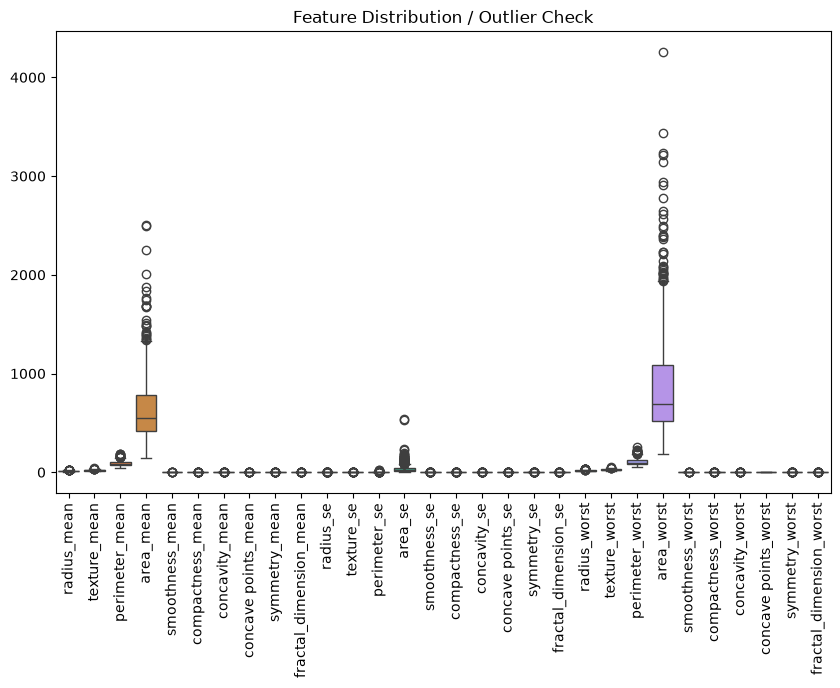

In [11]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=BC.drop(columns=["diagnosis"]))
plt.xticks(rotation=90)
plt.title("Feature Distribution / Outlier Check")
plt.show()

For this classification workflow, the supplied feature values are retained. Standardization is applied before Logistic Regression so features on different numeric scales are comparable.

## 3) Independent (X) and Dependent (Y) Data

In [12]:
X = BC.drop("diagnosis", axis=1)
Y = BC["diagnosis"]

print("X shape:", X.shape)
print("Y shape:", Y.shape)

X shape: (569, 30)
Y shape: (569,)


## 4) Train / Test Split

In [13]:
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.25, random_state=42, stratify=Y
)

print("Training rows:", X_train.shape[0])
print("Testing rows :", X_test.shape[0])

Training rows: 426
Testing rows : 143


## 5) Standardization

In [14]:
STD = StandardScaler()

X_train_STD = STD.fit_transform(X_train)
X_test_STD = STD.transform(X_test)

X_train_STD = pd.DataFrame(X_train_STD, columns=X.columns, index=X_train.index)
X_test_STD = pd.DataFrame(X_test_STD, columns=X.columns, index=X_test.index)

X_train_STD.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
251,-0.745750,-0.221894,-0.767638,-0.699925,-0.177450,-0.814845,-0.770582,-0.718931,0.073676,-0.466541,...,-0.689742,-0.559811,-0.723010,-0.654252,-0.593686,-0.957479,-0.927050,-0.755265,-0.265180,-1.064013
373,1.809320,-0.478913,1.729345,1.869571,-0.107095,0.087784,0.789726,1.030298,-0.884252,-1.113563,...,1.828667,-0.442372,1.718486,1.793915,1.020468,0.342793,0.683250,1.453604,-0.345860,-0.745834
211,-0.650703,-0.107404,-0.677127,-0.642862,-0.507630,-0.642799,-0.766753,-0.891003,-1.022660,-0.292015,...,-0.622720,-0.141330,-0.661739,-0.590539,-0.180565,-0.418832,-0.609415,-0.699346,-0.589483,-0.220391
52,-0.622749,-0.270961,-0.669009,-0.616269,-0.932545,-1.049540,-0.852846,-0.902203,0.197514,-0.216813,...,-0.663339,-0.746722,-0.706963,-0.623077,-0.759787,-1.060153,-0.874247,-0.792847,-0.193991,-0.548093
315,-0.468997,-0.595739,-0.527762,-0.494387,-0.758399,-1.223101,-1.041178,-1.082090,-2.180915,-0.836876,...,-0.614596,-1.014682,-0.683330,-0.594117,-0.930146,-1.316383,-1.223623,-1.325061,-1.567138,-1.239347


## 6) Model — Logistic Regression

In [15]:
LR = LogisticRegression(max_iter=5000, random_state=42)
LR.fit(X_train_STD, Y_train)

,"random_state random_state: int, RandomState instance, default=NoneUsed when ``solver`` == 'sag', 'saga' or 'liblinear' to shuffle thedata. See :term:`Glossary <random_state>` for details.",42
,"max_iter max_iter: int, default=100Maximum number of iterations taken for the solvers to converge.",5000
,"penalty penalty: {'l1', 'l2', 'elasticnet', None}, default='l2'Specify the norm of the penalty:- `None`: no penalty is added;- `'l2'`: add an L2 penalty term and it is the default choice;- `'l1'`: add an L1 penalty term;- `'elasticnet'`: both L1 and L2 penalty terms are added... warning:: Some penalties may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionadded:: 0.19 l1 penalty with SAGA solver (allowing 'multinomial' + L1).. deprecated:: 1.8 `penalty` was deprecated in version 1.8 and will be removed in 1.10. Use `l1_ratio` and `C` instead. `l1_ratio=0` for `penalty='l2'`, `l1_ratio=1` for `penalty='l1'`, `l1_ratio` set to any float between 0 and 1 for `penalty='elasticnet'`, and `C=np.inf` for `penalty=None`.",'deprecated'
,"C C: float, default=1.0Inverse of regularization strength; must be a positive float.Like in support vector machines, smaller values specify strongerregularization. `C=np.inf` results in unpenalized logistic regression.For a visual example on the effect of tuning the `C` parameterwith an L1 penalty, see::ref:`sphx_glr_auto_examples_linear_model_plot_logistic_path.py`.",1.0
,"l1_ratio l1_ratio: float, default=0.0The Elastic-Net mixing parameter, with `0 <= l1_ratio <= 1`. Setting`l1_ratio=1` gives a pure L1-penalty, setting `l1_ratio=0` a pure L2-penalty.Any value between 0 and 1 gives an Elastic-Net penalty of the form`l1_ratio * L1 + (1 - l1_ratio) * L2`... warning:: Certain values of `l1_ratio`, i.e. some penalties, may not work with some solvers. See the parameter `solver` below, to know the compatibility between the penalty and solver... versionchanged:: 1.8 Default value changed from None to 0.0... deprecated:: 1.8 `None` is deprecated and will be removed in version 1.10. Always use `l1_ratio` to specify the penalty type.",0.0
,"dual dual: bool, default=FalseDual (constrained) or primal (regularized, see also:ref:`this equation <regularized-logistic-loss>`) formulation. Dual formulationis only implemented for l2 penalty with liblinear solver. Prefer `dual=False`when n_samples > n_features.",False
,"tol tol: float, default=1e-4Tolerance for stopping criteria.",0.0001
,"fit_intercept fit_intercept: bool, default=TrueSpecifies if a constant (a.k.a. bias or intercept) should beadded to the decision function.",True
,"intercept_scaling intercept_scaling: float, default=1Useful only when the solver `liblinear` is usedand `self.fit_intercept` is set to `True`. In this case, `x` becomes`[x, self.intercept_scaling]`,i.e. a ""synthetic"" feature with constant value equal to`intercept_scaling` is appended to the instance vector.The intercept becomes``intercept_scaling * synthetic_feature_weight``... note:: The synthetic feature weight is subject to L1 or L2 regularization as all other features. To lessen the effect of regularization on synthetic feature weight (and therefore on the intercept) `intercept_scaling` has to be increased.",1
,"class_weight class_weight: dict or 'balanced', default=NoneWeights associated with classes in the form ``{class_label: weight}``.If not given, all classes are supposed to have weight one.The ""balanced"" mode uses the values of y to automatically adjustweights inversely proportional to class frequencies in the input dataas ``n_samples / (n_classes * np.bincount(y))``.Note that these weights will be multiplied with sample_weight (passedthrough the fit method) if sample_weight is specified... versionadded:: 0.17 *class_weight='balanced'*",None
,"solver solver: {'lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'}, default='lbfgs'Algorithm to use in the optimization problem. Default is 'lb

In [16]:
Pred = LR.predict(X_test_STD)
Pred_Prob = LR.predict_proba(X_test_STD)[:, 1]

print("Accuracy :", accuracy_score(Y_test, Pred))
print("Precision:", precision_score(Y_test, Pred))
print("Recall   :", recall_score(Y_test, Pred))
print("F1 Score :", f1_score(Y_test, Pred))
print("ROC-AUC  :", roc_auc_score(Y_test, Pred_Prob))

Accuracy : 0.965034965034965
Precision: 0.98
Recall   : 0.9245283018867925
F1 Score : 0.9514563106796117
ROC-AUC  : 0.9962264150943396


## 7) Evaluation

In [17]:
print("Classification Report:\n")
print(classification_report(
    Y_test, Pred,
    target_names=["Benign", "Malignant"]
))

Classification Report:

              precision    recall  f1-score   support

      Benign       0.96      0.99      0.97        90
   Malignant       0.98      0.92      0.95        53

    accuracy                           0.97       143
   macro avg       0.97      0.96      0.96       143
weighted avg       0.97      0.97      0.96       143



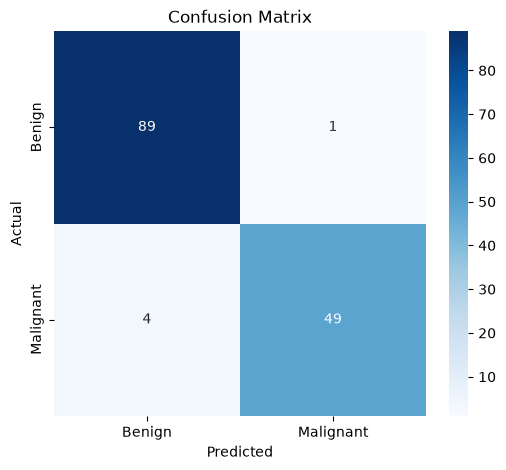

In [18]:
CM = confusion_matrix(Y_test, Pred)

plt.figure(figsize=(6, 5))
sns.heatmap(
    CM, annot=True, fmt="d", cmap="Blues",
    xticklabels=["Benign", "Malignant"],
    yticklabels=["Benign", "Malignant"]
)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

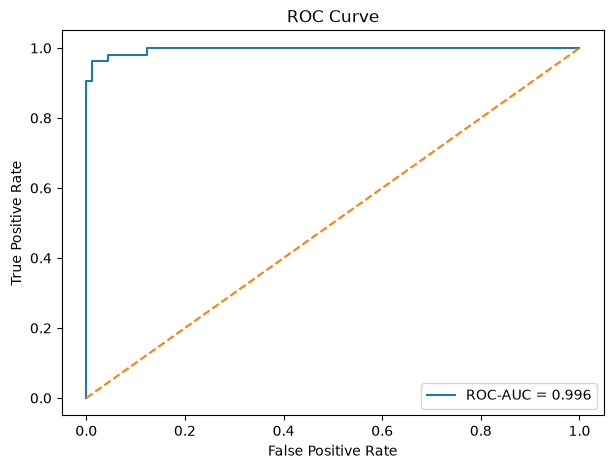

In [19]:
FPR, TPR, _ = roc_curve(Y_test, Pred_Prob)

plt.figure(figsize=(7, 5))
plt.plot(FPR, TPR, label=f"ROC-AUC = {roc_auc_score(Y_test, Pred_Prob):.3f}")
plt.plot([0, 1], [0, 1], "--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [20]:
results = pd.DataFrame({
    "Actual": Y_test,
    "Predicted": Pred,
    "Malignant_Probability": Pred_Prob
}, index=Y_test.index)

results.head(20)

,Actual,Predicted,Malignant_Probability
12,1,1,9.993884e-01
506,0,0,3.917798e-03
321,1,1,9.997004e-01
71,0,0,2.124205e-08
375,0,0,3.452169e-02
362,0,0,3.599882e-03
442,0,0,3.685751e-04
125,0,0,1.947449e-03
267,0,0,6.911856e-03
347,0,0,9.885457e-02


## 8) Feature Importance

In [21]:
feature_importance = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": LR.coef_[0],
    "Absolute_Coefficient": np.abs(LR.coef_[0])
}).sort_values("Absolute_Coefficient", ascending=False)

feature_importance.head(15)

,Feature,Coefficient,Absolute_Coefficient
21,texture_worst,1.365780,1.365780
10,radius_se,1.267201,1.267201
28,symmetry_worst,1.036496,1.036496
7,concave points_mean,0.963006,0.963006
15,compactness_se,-0.927483,0.927483
23,area_worst,0.889377,0.889377
20,radius_worst,0.887040,0.887040
13,area_se,0.878478,0.878478
6,concavity_mean,0.874054,0.874054
26,concavity_worst,0.867881,0.867881


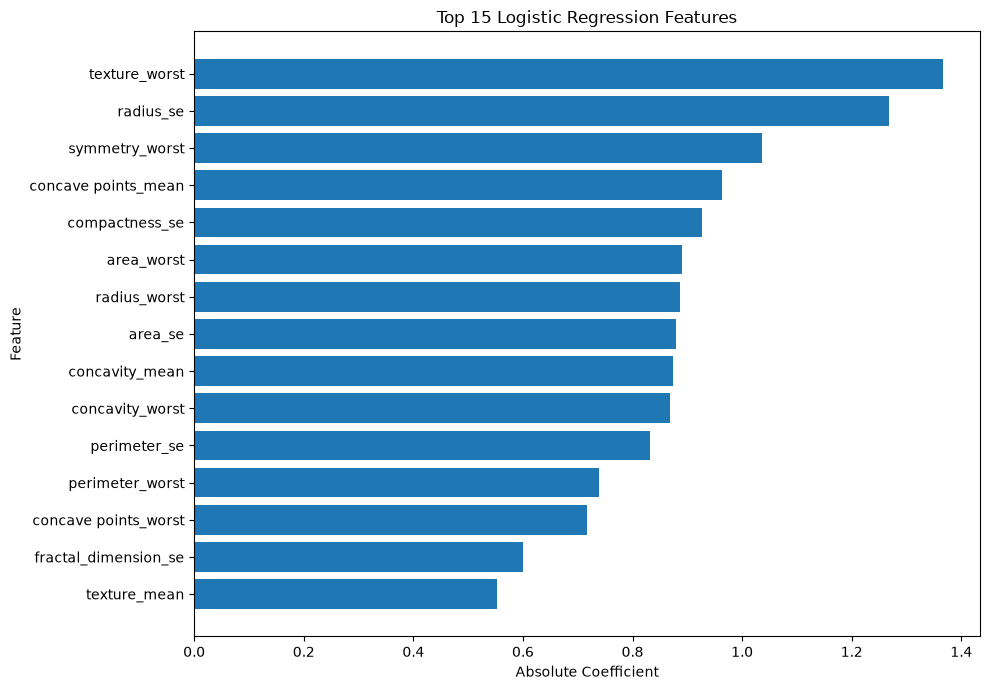

In [22]:
plt.figure(figsize=(10, 7))
top_features = feature_importance.head(15).sort_values("Absolute_Coefficient")
plt.barh(top_features["Feature"], top_features["Absolute_Coefficient"])
plt.xlabel("Absolute Coefficient")
plt.ylabel("Feature")
plt.title("Top 15 Logistic Regression Features")
plt.tight_layout()
plt.show()

In [23]:
sns.pairplot(BC)

In [24]:
pickle.dump(LR,open('model.pkl','wb'))
pickle.dump(list(X.columns),open('columns.pkl','wb'))

In [25]:
X.columns

Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='str')

## Conclusion

1. The breast-cancer dataset was loaded from CSV.
2. The `id` column was removed because it is only an identifier.
3. `diagnosis` was encoded as B = 0 and M = 1.
4. The data was divided into training and testing sets using stratification.
5. Features were standardized using `StandardScaler`.
6. Logistic Regression was trained as the classification model.
7. Accuracy, precision, recall, F1-score, ROC-AUC and a confusion matrix were used for evaluation.
8. The trained model package and feature-column list were saved with pickle.

**Note:** This is a machine-learning classification exercise and is not a medical diagnostic system.